## Imports

In [11]:
import pandas as pd
import requests

import os
from os import path
#import matplotlib.pyplot as plt
import cv2

import matplotlib.pyplot as plt
import numpy as np

import json

# Data loading

In [12]:
data_folder = '../data/test/'

with open('../data/OCR_SPACE_API_KEY.txt', mode='rt') as file:
    api_key = file.readline()

In [13]:
def load_ocr_space_file(filename, overlay=False, api_key='helloworld', language='en'):
    """ Sends OCR.space API request """

    payload = {'isOverlayRequired': overlay,
               'apikey': api_key,
               'language': language,
               }
    
    with open(filename, 'rb') as f:
        r = requests.post('https://api.ocr.space/parse/image',
                          files={filename: f},
                          data=payload,
                          )
    return r.content.decode()

In [14]:
def load_free_api(filename):
    # Ошибка на сервере 500
    url = "https://freeocrapi.com/api"
    
    with open(filename, mode='rb') as file:
        data = {'file': file}
        response = requests.request("POST", url, files=data)
        print(response.text)
    
    return response.text

## Check OCR results

Посмотрим на качество распознавания сервиса **OCRSpace**

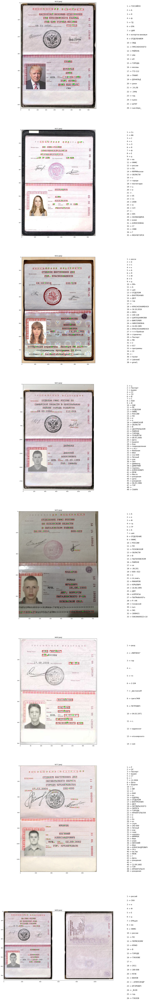

In [56]:
data_folder = '../data/test/'


target_files_list = [file_name for file_name in os.listdir(data_folder) if '.jpeg' in file_name]
img_count = len(target_files_list)

fig, axes = plt.subplots(img_count, 2, gridspec_kw={'width_ratios': [4, 1]}, figsize=(24, img_count * 20))

drop_axes_list = list()

for ind, file_name in enumerate(target_files_list):
    
    temp_img_path = path.normpath(data_folder + f'\\{file_name}')
    
    temp_image = cv2.imread(temp_img_path)
    
    cur_results = json.loads(load_ocr_space_file(temp_img_path, overlay=True, api_key=api_key, language='rus'))
    
    try:
        
        bounding_box_list = [(word_dict['WordText'], 
                              (int(word_dict['Left']), int(word_dict['Top']), int(word_dict['Height']), int(word_dict['Width']))) 
                             for item in cur_results['ParsedResults'][0]['TextOverlay']['Lines'] 
                             for word_dict in item['Words']]
    except KeyError:
        drop_axes_list.append(ind)
        continue
    
    
    for box_ind, (text, bbox) in enumerate(bounding_box_list, 1):
        # unpack the bounding box
        (left, top, height, width) = bbox

        cv2.rectangle(temp_image, (left, top), (left + width, top + height), (0, 0, 255), 1)
        cv2.putText(temp_image, str(box_ind), (left + width // 2, top + height // 2),
        cv2.FONT_HERSHEY_COMPLEX, 0.3, (0, 255, 0))
        
        axes[ind, 1].text(0, 1 - box_ind / len(bounding_box_list), 
                          f'{box_ind} -> {text}', fontsize=15, transform=axes[ind, 1].transAxes)
        

    img_obj = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)

    
    
    img_width, img_height, _ = img_obj.shape

    cv2.resize(img_obj, (int(3 * img_width), int(3 * img_height)))

    axes[ind, 0].imshow(img_obj)
    axes[ind, 1].axis('off')
    axes[ind, 0].set_title(f'№{ind + 1}({file_name})')
    
# Clear axes with errors
for t_ind in drop_axes_list:
    fig.delaxes(axes[ind, 0])
    fig.delaxes(axes[ind, 1])

Выводы по данному API:
* Бесплатное
* Качество сильно зависит от разрешения
* Некоторые слова плохо распознаются и разрываются на несколько объектов
* Также детектор промахивается 